# 🐶 End-to-end Multi-class Dog Breed Classification

This notebook builds an end-to-end muti-class image classifier using TensorFlow 2.x and TensorFlow Hub.

## 1. Problem

Identifying the breed of a dog given an image of a dog.

When i am sitting in a cafe and i take a photo of a dog, I will want to know what dog breed it is

## 2. Data

The Data we're using is kaggle's dog breed identification competition.

https://www.kaggle.com/competitions/dog-breed-identification/data


## 3. Evaluation

The evaluation is a file with prediction probabilities for each dog breed of each test image.

https://www.kaggle.com/competitions/dog-breed-identification/overview/evaluation

## 4. Features

Some information about the data:
* We're dealing with image (unstructured data) so it's probably the best if we use deep learning/transfer learning.
* There are 120 breeds of dog (this means that there are 120 different classes).
* There are around 10,000+ images in the training set (this images has labels)
* There are around 10,000+ images in the test set (this images does not have labels, because i will want to predict them).

In [1]:
# unzip the uploaded data into Google Drive
# !unzip "drive/MyDrive/Dog Vision/dog-breed-identification.zip" -d "drive/MyDrive/Dog Vision/"

### Get your workflow ready

* Import a TensorFlow 2.x ✅
* Import TensorFlow Hub ✅
* Make sure we're using a GPU ✅

In [7]:
# import TensorFlow into colab
import tensorflow as tf
print('TF version :', tf.__version__)

TF version : 2.12.0


In [29]:
# import the necessary tools

import tensorflow as tf
import tensorflow_hub as hub
print('TF version:', tf.__version__)
print('TF Hub version:', hub.__version__)

# check for GPU availability
print('GPU', 'available (yess!)' if tf.config.list_physical_devices('GPU') else 'not available ):')

TF version: 2.12.0
TF Hub version: 0.14.0
GPU not available ):


## Getting our data ready (turning into Tensors)
With all the machine learning models, our data has to be numerical format,so that what we'll be doing first. Turning our images into tensors (numerical representations).

Let's start accessing data and checking labels.

In [16]:
# check out the label data
import pandas as pd
labels_csv= pd.read_csv('drive/MyDrive/Dog Vision/labels.csv')
print(labels_csv.describe())
print(labels_csv.head())


                                      id               breed
count                              10222               10222
unique                             10222                 120
top     000bec180eb18c7604dcecc8fe0dba07  scottish_deerhound
freq                                   1                 126
                                 id             breed
0  000bec180eb18c7604dcecc8fe0dba07       boston_bull
1  001513dfcb2ffafc82cccf4d8bbaba97             dingo
2  001cdf01b096e06d78e9e5112d419397          pekinese
3  00214f311d5d2247d5dfe4fe24b2303d          bluetick
4  0021f9ceb3235effd7fcde7f7538ed62  golden_retriever


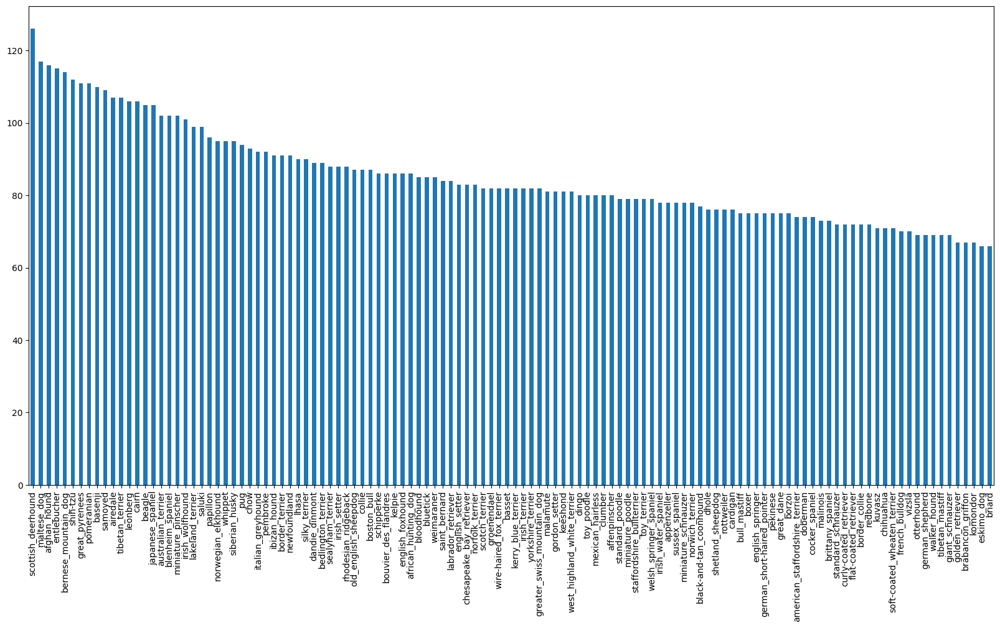

In [5]:
# How many image are there for each breed
labels_csv['breed'].value_counts().plot.bar(figsize=(20,10));

In [6]:
labels_csv['breed'].value_counts().median()

82.0

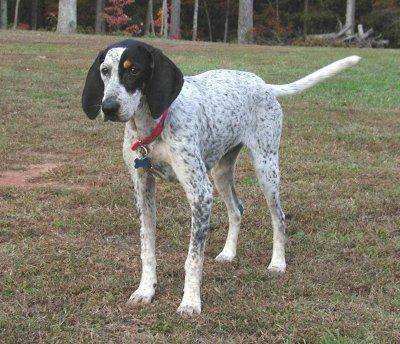

In [7]:
# Let's view our image
from IPython.display import Image
Image("drive/MyDrive/Dog Vision/train/00214f311d5d2247d5dfe4fe24b2303d.jpg")

### Getting images and their labels
Let's get a list of all of our image file pathnames.

In [8]:
labels_csv.head()

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


In [17]:
# create pathnames from image id's
filenames = ['drive/MyDrive/Dog Vision/train/' + fname + '.jpg' for fname in labels_csv['id']]

# check for the first 10
filenames[:10]

['drive/MyDrive/Dog Vision/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 'drive/MyDrive/Dog Vision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 'drive/MyDrive/Dog Vision/train/001cdf01b096e06d78e9e5112d419397.jpg',
 'drive/MyDrive/Dog Vision/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 'drive/MyDrive/Dog Vision/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 'drive/MyDrive/Dog Vision/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 'drive/MyDrive/Dog Vision/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 'drive/MyDrive/Dog Vision/train/002a283a315af96eaea0e28e7163b21b.jpg',
 'drive/MyDrive/Dog Vision/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 'drive/MyDrive/Dog Vision/train/0042188c895a2f14ef64a918ed9c7b64.jpg']

In [2]:
import os
os.listdir('drive/MyDrive/Dog Vision/train')[:10]

['e401d9046968cb01f5bdb97f92e61428.jpg',
 'e17462ffe48dffec8ff70325a6047957.jpg',
 'dfc97c3d7a59ad4d89e791e6ab14c49f.jpg',
 'e5f8c5b22071d0a266d80e3f9edc1cd0.jpg',
 'dd3509cbfcfc094e5e4726b648a26048.jpg',
 'e792459978c605f740a2b553ec1608f6.jpg',
 'e7f2f67cb616281a89fc77a6bdea6eb0.jpg',
 'e4b99d348bb5eec10e433c02173d057e.jpg',
 'e65087fe4a5ef4495d30e454f281b06f.jpg',
 'dbde111456535431c6caedfa5b8c8dea.jpg']

In [11]:
# Check the number of names actually matches the number of image files
import os
if len(os.listdir('drive/MyDrive/Dog Vision/train')) == len(filenames):
  print('Filenames actual match amount of files. Proceed!!')
else:
  print('Filenames do not actually match the amount of files, check the target directory.')


Filenames actual match amount of files. Proceed!!


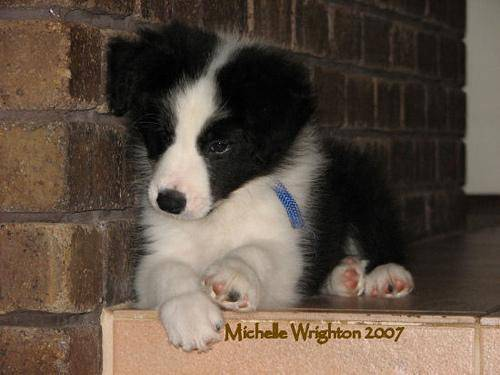

In [12]:
# one more check
Image(filenames[9005])

In [13]:
labels_csv['breed'][9005]

'collie'

Since we've now got our training image filepath in a list, let's prepare our labels.

In [19]:
import numpy as np
labels = labels_csv.breed
labels = np.array(labels)
labels

array(['boston_bull', 'dingo', 'pekinese', ..., 'airedale',
       'miniature_pinscher', 'chesapeake_bay_retriever'], dtype=object)

In [15]:
len(labels)

10222

In [16]:
# let's check if number of labels matches the number of filenames
if len(labels) == len(filenames):
  print('Number oflabels matches the number of filenames')
else:
  print('Number of labels does not matches the number of filenames. check data directories.')

Number oflabels matches the number of filenames


In [20]:
# Find the unique labels values
unique_breeds = np.unique(labels)
len(unique_breeds)

120

In [18]:
# Turn a single abel into array of booleans
print(labels[0])
labels[0] == unique_breeds


boston_bull


array([False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False,  True, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False])

In [19]:
#Turn every label to boolean array
boolean_labels = [label == unique_breeds for label in labels]
boolean_labels[:2]

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

In [20]:
len(boolean_labels)

10222

In [21]:
len(labels)

10222

In [22]:
# Example: Turning boolean array into integers
print(labels[0]) # original label
print(np.where(unique_breeds == labels[0])) # index where the label occurs
print(boolean_labels[0].argmax()) # index where the label occur in boolean
print(boolean_labels[0].astype(int)) # there will be 1 where the samplelabel occur

boston_bull
(array([19]),)
19
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


In [23]:
print(labels[5])
print(boolean_labels[5].astype(int))

bedlington_terrier
[0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


In [24]:
filenames[:10]

['drive/MyDrive/Dog Vision/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 'drive/MyDrive/Dog Vision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 'drive/MyDrive/Dog Vision/train/001cdf01b096e06d78e9e5112d419397.jpg',
 'drive/MyDrive/Dog Vision/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 'drive/MyDrive/Dog Vision/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 'drive/MyDrive/Dog Vision/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 'drive/MyDrive/Dog Vision/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 'drive/MyDrive/Dog Vision/train/002a283a315af96eaea0e28e7163b21b.jpg',
 'drive/MyDrive/Dog Vision/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 'drive/MyDrive/Dog Vision/train/0042188c895a2f14ef64a918ed9c7b64.jpg']

### Creating our own validation set
Since kaggle did not give us one, we're creating our own

In [25]:
# setup X and y variable
X = filenames
y = boolean_labels


In [26]:
len(X)

10222

We are going to start off experimenting ~1000 images and increase as needed

In [27]:
# Set number of images to use for experimenting
NUM_IMAGES = 1000 #@param {type:"slider", min:1000, max: 10000, step: 1000}

In [28]:
# let's split our data into training vaidation
from sklearn.model_selection import train_test_split

# Spiliting the data(NUM_IMAGES) into training and validation data
X_train, X_val, y_train, y_val = train_test_split(X[:NUM_IMAGES],
                                                  y[:NUM_IMAGES],
                                                  test_size = 0.2,
                                                  random_state= 42)
len(X_train), len(X_val), len(y_train), len(y_val)

(800, 200, 800, 200)

In [29]:
# let"s have alook in the training data
X_train[:5], y_train[:2]

(['drive/MyDrive/Dog Vision/train/00bee065dcec471f26394855c5c2f3de.jpg',
  'drive/MyDrive/Dog Vision/train/0d2f9e12a2611d911d91a339074c8154.jpg',
  'drive/MyDrive/Dog Vision/train/1108e48ce3e2d7d7fb527ae6e40ab486.jpg',
  'drive/MyDrive/Dog Vision/train/0dc3196b4213a2733d7f4bdcd41699d3.jpg',
  'drive/MyDrive/Dog Vision/train/146fbfac6b5b1f0de83a5d0c1b473377.jpg'],
 [array([False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False,  True,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, 

## Preprocessing Image (Turning image into tensor)
To preprocess our image we're going to write a function which does few things:

1. Take an image filepath as an input
2. Use TensorFlow to read the file and save it to a variable `Image`
3. Turn our `image` (a jpg) into Tensors
4. Resize the `image` to be of shape (224,224)
5. Return the modified `image`

### Before we do let's see what an importing image looks like.

In [30]:
# Convert an image into Numpy
from matplotlib.pyplot import imread
image = imread(filenames[42])
image.shape

(257, 350, 3)

In [31]:
# image 42 in numpy array (numbers)
image

array([[[ 89, 137,  89],
        [ 76, 124,  76],
        [ 63, 111,  61],
        ...,
        [ 77, 133,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  75],
        [ 67, 114,  68],
        [ 63, 110,  64],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 132,  84]],

       [[ 56, 104,  66],
        [ 58, 106,  68],
        [ 64, 112,  74],
        ...,
        [ 71, 127,  82],
        [ 73, 129,  84],
        [ 74, 130,  85]],

       ...,

       [[  2,  11,  10],
        [  5,  14,  11],
        [  8,  14,  14],
        ...,
        [120, 113,  67],
        [126, 118,  71],
        [122, 114,  67]],

       [[  0,   3,   7],
        [  2,   7,  10],
        [  3,   9,   7],
        ...,
        [105,  98,  54],
        [112, 104,  58],
        [111, 103,  57]],

       [[ 16,  18,  30],
        [ 16,  19,  24],
        [ 15,  20,  14],
        ...,
        [101,  92,  51],
        [ 97,  88,  47],
        [120, 111,  70]]

In [32]:
labels_csv.breed[42]

'dhole'

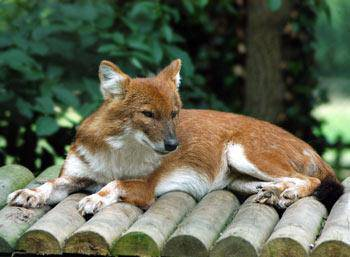

In [33]:
from IPython.display import Image
Image(filenames[42])

In [34]:
image.max(), image.min()

(255, 0)

In [35]:
# we can also use tensor (tensor is very similar to numpy)
tf.constant(image)

<tf.Tensor: shape=(257, 350, 3), dtype=uint8, numpy=
array([[[ 89, 137,  89],
        [ 76, 124,  76],
        [ 63, 111,  61],
        ...,
        [ 77, 133,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  75],
        [ 67, 114,  68],
        [ 63, 110,  64],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 132,  84]],

       [[ 56, 104,  66],
        [ 58, 106,  68],
        [ 64, 112,  74],
        ...,
        [ 71, 127,  82],
        [ 73, 129,  84],
        [ 74, 130,  85]],

       ...,

       [[  2,  11,  10],
        [  5,  14,  11],
        [  8,  14,  14],
        ...,
        [120, 113,  67],
        [126, 118,  71],
        [122, 114,  67]],

       [[  0,   3,   7],
        [  2,   7,  10],
        [  3,   9,   7],
        ...,
        [105,  98,  54],
        [112, 104,  58],
        [111, 103,  57]],

       [[ 16,  18,  30],
        [ 16,  19,  24],
        [ 15,  20,  14],
        ...,
        [101,  92,  5

### Now we have seen how imagelook like as a tensor, lets make a function to preprocess them
1. Take an image filepath as an input
2. Use TensorFlow to read the file and save it to a variable `Image`
3. Turn our `image` (a jpg) into Tensors
4. Normalize our image (convert colors channels value from 0-255 to 0-1).
5. Resize the `image` to be of shape (224, 224)
6. Return the modified `image`

In [9]:
# Define image size
IMG_SIZE = 224

# Create a function for preprocessing images
def process_image(image_path, img_size = IMG_SIZE):
  '''
  Takes the image file path and turn it into Tensor.
  '''
  # Read in an image file
  image = tf.io.read_file(image_path)
  # Turn the jpeg image into numerical tensor with three colors (Red, Green,Blue)
  image = tf.image.decode_jpeg(image, channels=3)
  # Convert the color channel values from 0-255 to 0-1
  image = tf.image.convert_image_dtype(image, tf.float32)
  # Resize the image to our desired value (224, 224)
  image = tf.image.resize(image, size=[IMG_SIZE, IMG_SIZE])

  return image

## Turning our data into batches
why turn our data into batches?
let's say we are trying to turn 10,000+ images in one go...they all might not fit into memory.

So that why we do about 32 (this is the batch size) images at a time (you can manually adjust the batch size if the need be).

Inorder to use TensorFlow effectively, we need our data in form of Tensor tuples which will look like this: `(image, label)`

In [10]:
# Create a simple function to return a tuple
def get_image_label(image_path, label):
  '''
  Takes an image file path name and associated label
  processes the images and return tuple of (image, label)
  '''
  image = process_image(image_path)
  return image, label

In [38]:
# Demo of the above
(process_image(X[42]), tf.constant(y[42]))

(<tf.Tensor: shape=(224, 224, 3), dtype=float32, numpy=
 array([[[0.3264178 , 0.5222886 , 0.3232816 ],
         [0.2537167 , 0.44366494, 0.24117757],
         [0.25699762, 0.4467087 , 0.23893751],
         ...,
         [0.29325107, 0.5189916 , 0.3215547 ],
         [0.29721776, 0.52466875, 0.33030328],
         [0.2948505 , 0.5223015 , 0.33406618]],
 
        [[0.25903144, 0.4537807 , 0.27294815],
         [0.24375686, 0.4407019 , 0.2554778 ],
         [0.2838985 , 0.47213382, 0.28298813],
         ...,
         [0.2785345 , 0.5027992 , 0.31004712],
         [0.28428748, 0.5108719 , 0.32523635],
         [0.28821915, 0.5148036 , 0.32916805]],
 
        [[0.20941195, 0.40692952, 0.25792548],
         [0.24045378, 0.43900946, 0.2868911 ],
         [0.29001117, 0.47937486, 0.32247734],
         ...,
         [0.26074055, 0.48414773, 0.30125174],
         [0.27101526, 0.49454468, 0.32096273],
         [0.27939945, 0.5029289 , 0.32934693]],
 
        ...,
 
        [[0.00634795, 0.03442048

### Now we've got a way to turn our data into tuples of Tensors in form: (image, label), let's make a function to turn all of our data (X & y) into batches!

In [11]:
# Define the batch size, 32 is a good start
BATCH_SIZE = 32

# Create a function to turn data into batches
def create_data_batches(X, y=None, batch_size= BATCH_SIZE, valid_data=False, test_data=False):
  '''
  Create batches out of image (X) and label (y) pairs.
  Shuffles thedata if it is a training data but don't shuffles the data if it is a validation data.
  Also accept test data as inputs (no labels).
  '''
  # if the data is a test dataset, we probably don't have a labels
  if test_data:
    print('Creating test data batches...')
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X))) # only filepath no labels
    data_batch = data.map(process_image).batch(BATCH_SIZE)
    return data_batch
    # if data is a valid dataset, we don't need to shuffle
  elif valid_data:
    print('Creating validation data batches...')
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X),  # filepaths
                                               tf.constant(y))) # labels
    data_batch = data.map(get_image_label).batch(BATCH_SIZE)
    return data_batch

  else:
    print('Creating data batches...')
    # Turn the filepath into Tensors
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X),
                                               tf.constant(y)))
    # Shuffling pathnames and labels before mapping image processor function is faster than shuffling images
    data = data.shuffle(buffer_size = len(X))

    # Create (image, label) tuples (this also turn image path into a preprocessed image)
    data = data.map(get_image_label)

    # Turn the training data into batches
    data_batch = data.batch(BATCH_SIZE)
  return data_batch

In [40]:
# Creating training and validation batches
train_data = create_data_batches(X_train, y_train)
val_data = create_data_batches(X_val, y_val, valid_data= True)

Creating data batches...
Creating validation data batches...


In [41]:
# Check out the different attributes of our data batches
train_data.element_spec, val_data.element_spec


((TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)),
 (TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)))

## Visualize Data Batches
Our data is now in batches, however, this can be hard to understand/comprehend, let's visualize them.

In [12]:
import matplotlib.pyplot as plt

# create a function for viewing images in a data batch
def show_25_images(images, labels):
  '''
  Display a plot of 25 images and their images from a data batch
  '''
  # setup the figure
  plt.figure(figsize= (10, 10))
  # Loop through 25 (Displaying 25 images)
  for i in range(25):
    # create subplots 5 rows and 5 columns
    ax = plt.subplot(5, 5, i+1)
    # Display images
    plt.imshow(images[i])
    # Add the image label as the title
    plt.title(unique_breeds[labels[i].argmax()])
    # Turn the grid line off
    plt.axis('off')

In [43]:
train_images, train_labels = next(train_data.as_numpy_iterator())
train_images, train_labels

(array([[[[0.47358775, 0.412987  , 0.36899143],
          [0.4416576 , 0.40648463, 0.37911102],
          [0.40676546, 0.38004625, 0.3589042 ],
          ...,
          [0.45990738, 0.4716721 , 0.49127993],
          [0.4903868 , 0.50215155, 0.5217594 ],
          [0.46452165, 0.47628635, 0.4958942 ]],
 
         [[0.4692804 , 0.4812888 , 0.45040503],
          [0.4226329 , 0.4046955 , 0.36318216],
          [0.5045777 , 0.40754154, 0.33866546],
          ...,
          [0.42722386, 0.43898857, 0.4585964 ],
          [0.4567144 , 0.4684791 , 0.48808694],
          [0.4703324 , 0.48209712, 0.501705  ]],
 
         [[0.37499297, 0.44677168, 0.40815878],
          [0.5071641 , 0.4981743 , 0.4378312 ],
          [0.5168972 , 0.36457467, 0.25773826],
          ...,
          [0.44084027, 0.45260498, 0.47284308],
          [0.41312313, 0.42488784, 0.44512594],
          [0.44708145, 0.45884615, 0.47908425]],
 
         ...,
 
         [[0.3724535 , 0.38029665, 0.32994646],
          [0.37099

In [44]:
len(train_images), len(train_labels)

(32, 32)

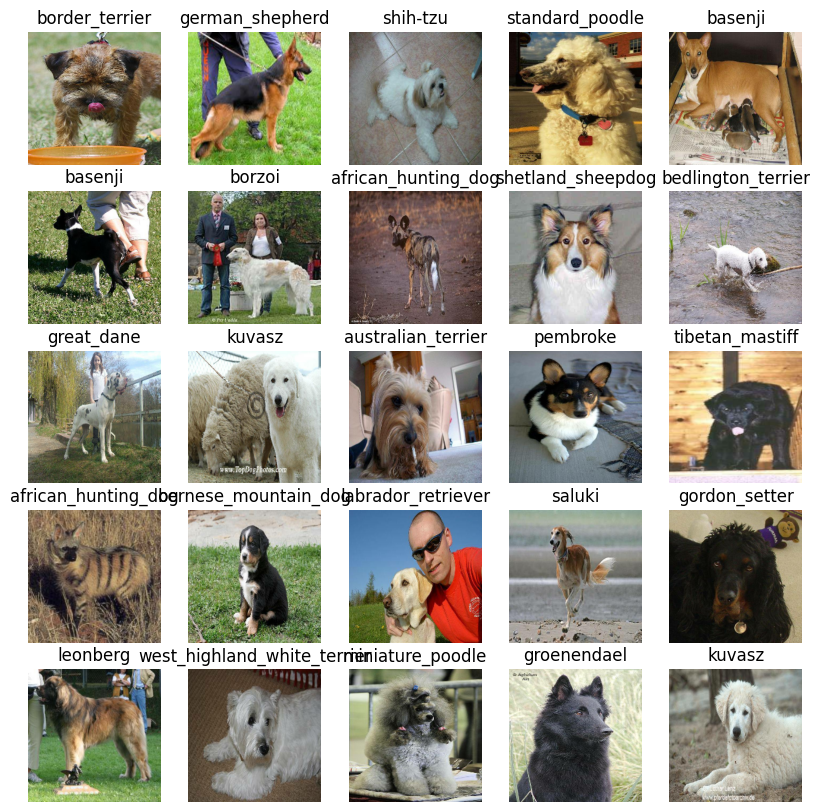

In [45]:
# Now let visualize our data in training batch
train_images, train_labels = next(train_data.as_numpy_iterator())
show_25_images(train_images, train_labels)

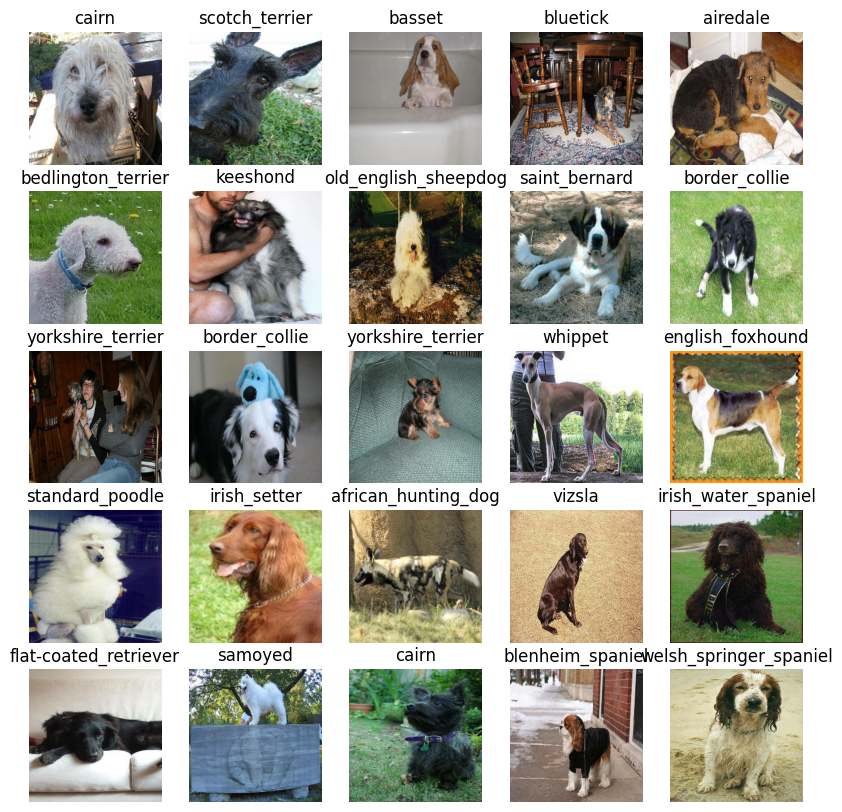

In [46]:
# Now let's visualize the vilidation dataset
val_images, val_labels = next(val_data.as_numpy_iterator())
show_25_images(val_images, val_labels)

## Building a model
Before we build a model, there are few things to define:
1. The input shape (our images shape, in form of Tensors) to our model
2. The output shape (image shape, in form of Tensors) of our model
3. The URL of the model we want to use - https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5

In [21]:
# setup the input shape
INPUT_SHAPE = [None, IMG_SIZE, IMG_SIZE, 3] # batch, height, width, colors channel

# setup our output shape
OUTPUT_SHAPE = len(unique_breeds)

# setup the model URL from TensorFlow Hub
MODEL_URL = 'https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5'



Now we've got our inputs, outputs and model ready to go. Let's put them together into keras deep learning model!

Knowing this, let"s create a function which:

* Takes the input shape, output shape and model we've chosen as parameters.
* Define the layers in keras model in sequential fashion ( Do this first, then this and then that).
* Compiles the model (says it should be evaluated and improved).
* Builds the model (tell the model it input shape it'll be getting).
* Return the model.

All these steps can be found here - https://www.tensorflow.org/guide/keras

In [22]:
# Create a function which builds a keras model
def create_model(input_shape = INPUT_SHAPE, output_shape = OUTPUT_SHAPE, model_url = MODEL_URL):
  print("Building model with:", MODEL_URL)

  # setup the model layers
  model = tf.keras.Sequential([
      hub.KerasLayer(MODEL_URL), # layer 1 (input layer)
      tf.keras.layers.Dense(units= OUTPUT_SHAPE,
                            activation= 'softmax') # layer 2 (output layer)
  ])

  # compile the model
  model.compile(
      loss=tf.keras.losses.CategoricalCrossentropy(),
      optimizer = tf.keras.optimizers.Adam(),
      metrics = ['accuracy']
  )

  # Build the model
  model.build(INPUT_SHAPE)

  return model

In [49]:
model = create_model()
model.summary()

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5
Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 keras_layer (KerasLayer)    (None, 1001)              5432713   
                                                                 
 dense (Dense)               (None, 120)               120240    
                                                                 
Total params: 5,552,953
Trainable params: 120,240
Non-trainable params: 5,432,713
_________________________________________________________________


## Creating Callbacks

Callbacksare helper functions amodel can use during training to do such things as save its progress, check its progress or stop training early if a model stop improving.

We'll create two callbacks, one for Tensorboard which helps us track our model progress and another for early stopping which prevent our model for training for too long.

### TensorBoard Callback

1. Load the Tensorboard notebook extension ✅
2. Crete a Tensorboard callback which able save log to a directory and pass it to our model's `fit()` function ✅
3. Visualize our models training logs with the `%tensorboard` magic function (we'll do this after model training)

In [27]:
# load the tensorboard notebook extension
%load_ext tensorboard

In [28]:
import datetime

# Create a function to build a Tensorboard callback
def create_tensorboard_callback():
  # Create a log directory for storing tensorboard logs
  logdir = os.path.join('drive/MyDrive/Dog Vision/logs',
                        # Make it so the log gets track whenever run experiment
                        datetime.datetime.now().strftime('%Y%m%d-%H%M%S'))
  return tf.keras.callbacks.TensorBoard(logdir)

### Early Stopping

Early stopping helps stop our model from overfitting by stopping training if a certain evaluation metric stop improving.

https://www.tensorflow.org/api_docs/python/tf/keras/callbacks/EarlyStopping

In [52]:
# Create early stopping callback
early_stopping = tf.keras.callbacks.EarlyStopping(monitor= 'val_loss',
                                                  patience = 3)

## Training a model (On subset of a data)

Our first model will train on 1000 images to make sure everything is working.


In [53]:
NUM_EPOCHS = 100 #@param {type: 'slider', min : 10, max : 100, step : 10}


In [54]:
# Check if we are still running on GPU
print('GPU', 'available (YESSS!!)' if tf.config.list_physical_devices('GPU') else 'not available :(')

GPU available (YESSS!!)


 Let's create a function which train a model

 * Create model using `create_model()`
 * Setup a TensorBoard callback using `create_tensorboard_callback()`
 * Call the `fit()` function on our model passing itthe training data, Validation data, number of epochs to train for (`NUM_EPOCHS`) and callbacks we'll like to use.
 * Return model


In [55]:
# Build a function to train and return a trained model
def train_model():
  '''
  Trains a given model and return the trained version.
  '''

  # Create a model
  model = create_model()

  # Create a new Tensorboard session everytime we train a model
  tensorboard = create_tensorboard_callback()

  # Fit the data passing it to the callbacks we created
  model.fit(x = train_data,
            epochs = NUM_EPOCHS,
            validation_data = val_data,
            validation_freq = 1,
            callbacks = [tensorboard, early_stopping])

  # Return the fitted model
  return model


In [56]:
# fit the model to the data
model = train_model()

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5
Epoch 1/100
25/25 [==============================] - 166s 4s/step - loss: 4.5093 - accuracy: 0.1063 - val_loss: 3.3235 - val_accuracy: 0.2650
Epoch 2/100
25/25 [==============================] - 4s 152ms/step - loss: 1.5807 - accuracy: 0.6925 - val_loss: 2.1175 - val_accuracy: 0.5100
Epoch 3/100
25/25 [==============================] - 3s 120ms/step - loss: 0.5442 - accuracy: 0.9463 - val_loss: 1.6554 - val_accuracy: 0.5700
Epoch 4/100
25/25 [==============================] - 4s 150ms/step - loss: 0.2415 - accuracy: 0.9900 - val_loss: 1.4846 - val_accuracy: 0.6300
Epoch 5/100
25/25 [==============================] - 4s 181ms/step - loss: 0.1406 - accuracy: 1.0000 - val_loss: 1.4022 - val_accuracy: 0.6400
Epoch 6/100
25/25 [==============================] - 3s 120ms/step - loss: 0.0962 - accuracy: 1.0000 - val_loss: 1.3570 - val_accuracy: 0.6400
Epoch 7/100
25/25 [==============================]

### Checking the Tensorboard log

The Tensorboard magic function (`%tensorboard`) will access the logs directory we created earlier and visualize it contents.

In [57]:
%tensorboard --logdir drive/MyDrive/Dog\ Vision/logs

<IPython.core.display.Javascript object>

## Making and evaluating predictions using trained data

In [58]:
val_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [59]:
# Make predictions on the validation data (not used to train on)
predictions = model.predict(val_data, verbose=1)
predictions

7/7 [==============================] - 1s 103ms/step


array([[1.4501049e-04, 7.9957081e-06, 3.2191270e-04, ..., 4.8528673e-04,
        2.9975790e-06, 1.1723903e-03],
       [7.2731992e-04, 3.1380553e-04, 5.1818998e-03, ..., 1.4173666e-04,
        9.4792755e-05, 4.8639624e-05],
       [3.8328562e-06, 3.8077173e-06, 3.9980429e-07, ..., 1.3369545e-06,
        4.9854557e-06, 1.7374005e-05],
       ...,
       [2.5373163e-07, 2.3644730e-05, 1.4061865e-06, ..., 2.6307750e-06,
        7.1357576e-06, 6.3654137e-05],
       [9.5914298e-04, 2.0319254e-05, 5.2282569e-05, ..., 5.4764314e-06,
        5.5252399e-06, 1.8523313e-03],
       [6.0164853e-04, 2.5256222e-05, 3.2705403e-04, ..., 6.4502298e-03,
        6.4517738e-04, 4.3778895e-05]], dtype=float32)

In [60]:
# First prediction
index = 0
print(predictions[index])
print(f"Max Value (probability of prediction): {np.max(predictions)}")
print(f"SUM: {np.sum(predictions[index])}")
print(f"Max index : {np.argmax(predictions[index])}")
print(f"Predicted Label : {unique_breeds[np.argmax(predictions[index])]}")

[1.45010490e-04 7.99570807e-06 3.21912696e-04 1.40335751e-05
 1.30540066e-04 1.64573412e-05 7.50638312e-03 3.17094673e-04
 9.85878432e-05 1.86432837e-04 1.37095587e-04 1.43376974e-05
 3.65629414e-04 7.69446615e-06 5.25126779e-05 1.78169757e-05
 2.88416086e-05 2.26716608e-01 4.20540528e-06 1.89542625e-05
 1.14333801e-04 2.16769200e-04 1.55751297e-06 1.15660357e-03
 5.41028066e-06 9.20343009e-05 2.79222518e-01 1.24948456e-05
 3.03283101e-04 7.03446276e-05 1.21235107e-05 3.72266833e-04
 1.17378084e-04 1.34283500e-05 1.98823564e-05 2.12333351e-02
 5.02325156e-06 6.74772746e-05 3.06364200e-05 8.96571146e-05
 1.09068840e-03 1.16127694e-05 1.51245244e-04 8.97548089e-05
 3.17130821e-06 3.51849121e-05 7.62640138e-06 9.42275219e-05
 2.82393856e-04 6.81945239e-05 2.80870590e-05 9.00670511e-06
 3.14917328e-04 1.48826162e-04 7.90643389e-05 2.55805571e-05
 2.27494547e-05 1.93552725e-04 9.15851342e-05 1.91277996e-01
 3.97506265e-05 5.80670940e-06 1.05569430e-03 1.58699149e-05
 1.05820119e-03 2.914265

Having the above functionality is great but we want to be able to do it at scale.

And it would be better if we can see the image the predictionis being made on.

**Note:*** The prediction probabilities are also known as confidence levels.

In [37]:
# Turn the probabilities into their respective labels (easier to understand)
def get_pred_label(prediction_probabilities):
  '''
  Turn an array of prediction probabilities into a label
  '''
  return unique_breeds[np.argmax(prediction_probabilities)]

# Get a predicted label based on the array of prediction prediction_probabilities
# pred_label = get_pred_label(predictions[99])
# pred_label

Now since our validation data is still in a batch dataset, we'll have to unbatchify it to make predictions on the validation image and then compare those predictions to the validation labels (Truth labels)


In [62]:
val_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [63]:
# Create a function to unbatch the batch dataset
def unbatchify(data):
  '''
  Take a batched dataset of (image, label) Tensors and return separate arrays of images and labels
  '''
  images = []
  labels = []

  # Loop through the unbatched data
  for image, label in val_data.unbatch().as_numpy_iterator():
    images.append(image)
    labels.append(unique_breeds[np.argmax(label)])
  return images, labels
# Unbatchify the validation data
val_images, val_labels = unbatchify(val_data)
val_images[0], val_labels[0]

(array([[[0.29599646, 0.43284872, 0.3056691 ],
         [0.26635826, 0.32996926, 0.22846507],
         [0.31428418, 0.27701408, 0.22934894],
         ...,
         [0.77614343, 0.82320225, 0.8101595 ],
         [0.81291157, 0.8285351 , 0.8406944 ],
         [0.8209297 , 0.8263737 , 0.8423668 ]],
 
        [[0.2344871 , 0.31603682, 0.19543913],
         [0.3414841 , 0.36560842, 0.27241898],
         [0.45016077, 0.40117094, 0.33964607],
         ...,
         [0.7663987 , 0.8134138 , 0.81350833],
         [0.7304248 , 0.75012016, 0.76590735],
         [0.74518913, 0.76002574, 0.7830809 ]],
 
        [[0.30157745, 0.3082587 , 0.21018331],
         [0.2905954 , 0.27066195, 0.18401104],
         [0.4138316 , 0.36170745, 0.2964005 ],
         ...,
         [0.79871625, 0.8418535 , 0.8606443 ],
         [0.7957738 , 0.82859945, 0.8605655 ],
         [0.75181633, 0.77904975, 0.8155256 ]],
 
        ...,
 
        [[0.9746779 , 0.9878955 , 0.9342279 ],
         [0.99153054, 0.99772066, 0.94278

In [64]:
# The function worked but model predicted wrongly here
print(get_pred_label(val_images[0]))
get_pred_label(val_labels[0])

vizsla


'affenpinscher'

Now we've got way to get get:
* Prediction labels
* Validation labels (Truth labels)
* Validation images

Let's make some function to make these all a bit more visualize.

We'll create a function which:

* Takes an array of prediction probabilities, an array of truth labels and array of images and integers.
* Convert the prediction probabilities into a predicted label
* Plot the predicted label, it predicted probability, the truth label and the target image on a single plot.   

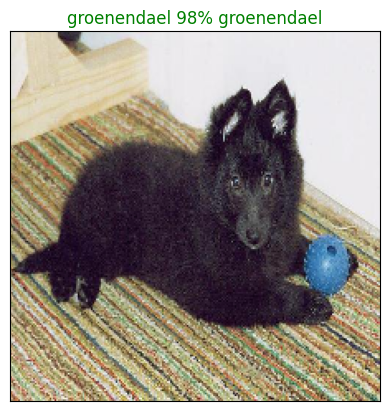

In [65]:

# Define the plot_pred function
def plot_pred(prediction_probabilities, labels, images, n):
    '''
    View the prediction, ground truth, and image for the sample n
    '''
    # Get the prediction probabilities, true label, and image for the sample n
    pred_prob, true_label, image = prediction_probabilities[n], labels[n], images[n]

    # Get the predicted label
    pred_label = get_pred_label(pred_prob)

    # Convert image data to a NumPy array and ensure it's in the [0, 1] range
    img = (image - image.min()) / (image.max() - image.min())

    # Plot the image and remove ticks
    plt.imshow(img)
    plt.xticks([])
    plt.yticks([])

    # Change the color of the title depending on if the prediction is right or wrong
    if pred_label == true_label:
      color = 'green'
    else:
      color = 'red'

    # Change the plot title to display the predicted label, probability of prediction, and true label
    plt.title('{} {:2.0f}% {}'.format(pred_label,
                                      np.max(pred_prob) * 100,
                                      true_label),
                                      color = color)


n = 77  # Choose an index within the valid range
plot_pred(prediction_probabilities=predictions,
          labels=val_labels,
          images=val_images,
          n=n)



Now we have got one function to visualize our models top prediction, let's make another to view our models top 10 predictions.

This function will:

* Take an input of prediction proabilities array and a ground truth array and an integer
* Find prediction using `get_pred_label()`
* Find the top 10:
    * prediction probabilities indexes
    * prediction probabilities values
    * prediction labels
* plot the top 10 prediction probability values and labels, colouring the true label green

In [66]:
def plot_pred_conf(prediction_probabilities, labels, n = 1 ):
  '''
  Plus the Top 10 prediction confidences along with the truth label for sample n
  '''
  pred_prob, true_label = prediction_probabilities[n], labels[n]

  # Get the predicted label
  pred_label = get_pred_label(pred_prob)

  # Find the top 10 prediction confidence indexes
  top_10_pred_indexes =pred_prob.argsort()[-10:][::-1]

  # Find the Top 10 prediction confidence values
  top_10_pred_values = pred_prob[top_10_pred_indexes]

  # Find the top 10 prediction labels
  top_10_pred_labels = unique_breeds[top_10_pred_indexes]

  # setup plot
  top_plot = plt.bar(np.arange(len(top_10_pred_labels)),
                     top_10_pred_values,
                     color = 'blue')
  plt.xticks(np.arange(len(top_10_pred_labels)),
             labels= top_10_pred_labels,
             rotation = 'vertical')

  # Change color of true label
  if np.isin(true_label, top_10_pred_labels):
    top_plot[np.argmax(top_10_pred_labels == true_label)].set_color('green')

  else:
    pass


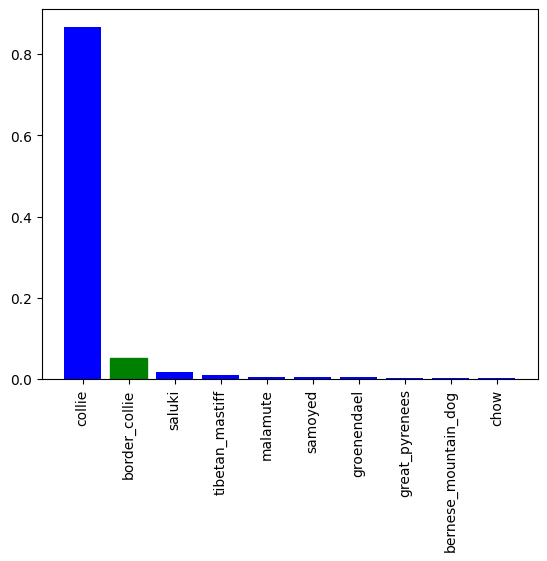

In [67]:
plot_pred_conf(prediction_probabilities = predictions,
               labels = val_labels,
               n=9)

Now we've got some function to help us visualize our predictions and evaluate our model, let's check out a few

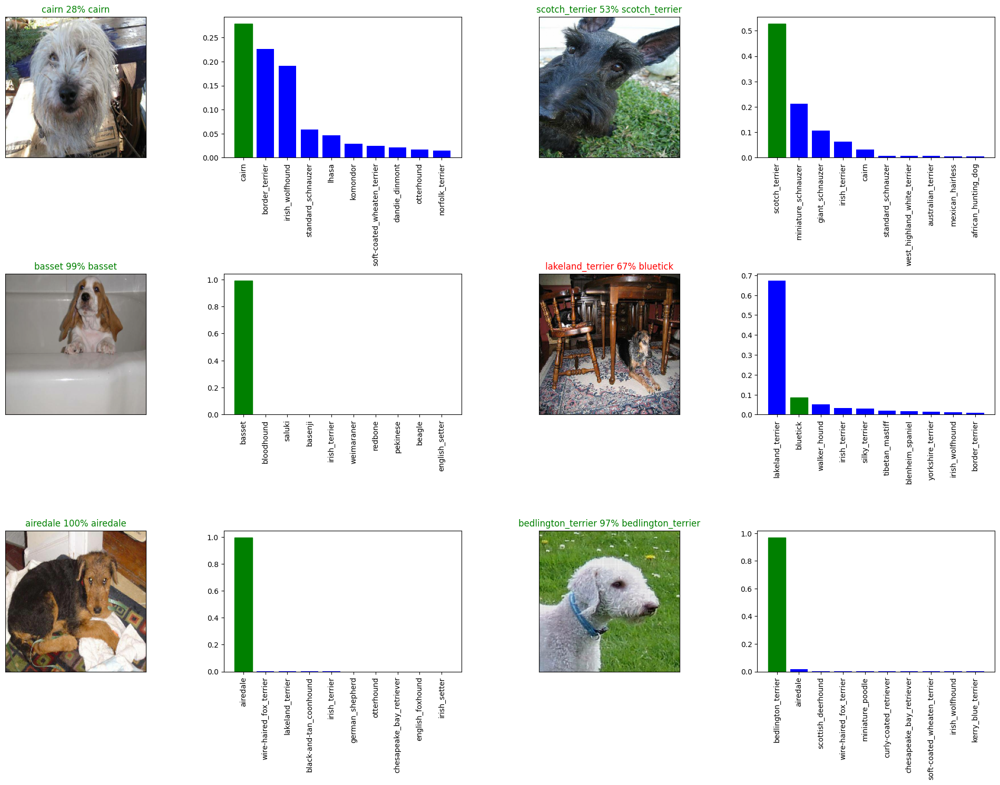

In [68]:
# Let's check out a few predictions and their different values
i_multiplier = 0
num_rows = 3
num_cols = 2
num_images = num_rows * num_cols

plt.figure(figsize=(10 * num_cols, 5 * num_rows))

for i in range(num_images):
  plt.subplot(num_rows, 2 * num_cols, 2 * i + 1)
  plot_pred(prediction_probabilities=predictions,
            labels=val_labels,
            images=val_images,
            n=i + i_multiplier)
  plt.subplot(num_rows, 2 * num_cols, 2 * i + 2)  # Fixed subplot index
  plot_pred_conf(prediction_probabilities=predictions,
                 labels=val_labels,
                 n=i + i_multiplier)
plt.tight_layout(h_pad=1.0)
plt.show()


## Saving and reloading a trained model


In [69]:
# Creating a function for a svaed model
def save_model(model, suffix = None):
  '''
  Save a given model in a model directory  and append to suffix (string)
  '''
  # Create a model directory pathname with the current time
  modeldir = os.path.join('drive/MyDrive/Dog Vision/models',
                          datetime.datetime.now().strftime('%Y%d-%H%M%s'))
  model_path = modeldir + '-' + suffix + ".h5"  # save the format of the model
  print(f"Saving model to : {model_path}...")
  model.save(model_path)

  return model_path

In [30]:
from tensorflow_hub.keras_layer import KerasLayer
# Create a function to load a trained model
def load_model(model_path):
  '''
  Load a saved model on a specify path
  '''
  print(f"Loading saved model from : {model_path}")
  model = tf.keras.models.load_model(model_path,
                                     custom_objects = {'KerasLayer': hub.KerasLayer })
  return model

Now we got fuction to save and load a trained model. let's make sure it work

In [71]:
# Save our model trained on 1000 images
save_model(model, suffix = "1000-images-mobilenetv2-Adam")

Saving model to : drive/MyDrive/Dog Vision/models/202311-09201691745614-1000-images-mobilenetv2-Adam.h5...


'drive/MyDrive/Dog Vision/models/202311-09201691745614-1000-images-mobilenetv2-Adam.h5'

In [72]:
# load a trained model
loaded_1000_image_model = load_model("drive/MyDrive/Dog Vision/models/202310-16201691684454-1000-images-mobilenetv2-Adam.h5")

Loading saved model from : drive/MyDrive/Dog Vision/models/202310-16201691684454-1000-images-mobilenetv2-Adam.h5


In [73]:
# Evaluate the pre-saved model
model.evaluate(val_data)

7/7 [==============================] - 1s 84ms/step - loss: 1.1769 - accuracy: 0.6850


[1.1769185066223145, 0.6850000023841858]

In [74]:
# Evaluate the loaded model
loaded_1000_image_model.evaluate(val_data)

7/7 [==============================] - 2s 125ms/step - loss: 1.1608 - accuracy: 0.7100


[1.1608093976974487, 0.7099999785423279]

## Training a big dog 🐶 model (full dataset)

In [75]:
len(X), len(y)

(10222, 10222)

In [76]:
# create a data batch with the full data set
full_data = create_data_batches(X, y)

Creating data batches...


In [77]:
full_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [78]:
# Create a model for full model
full_model = create_model()

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5


In [79]:
# Create a full model callback
full_model_tensorboard = create_tensorboard_callback()

# No validation set when training on all the data, so we can't monitor validation accuracy
full_model_early_stopping = tf.keras.callbacks.EarlyStopping(monitor = 'accuracy',
                                                             patience = 3)

In [81]:
# fit the full model to the full data
full_model.fit(x=full_data,
               epochs= NUM_EPOCHS,
               callbacks = [full_model_tensorboard, full_model_early_stopping])

Epoch 1/100
320/320 [==============================] - 40s 114ms/step - loss: 1.3135 - accuracy: 0.6708
Epoch 2/100
320/320 [==============================] - 34s 106ms/step - loss: 0.3939 - accuracy: 0.8854
Epoch 3/100
320/320 [==============================] - 35s 110ms/step - loss: 0.2377 - accuracy: 0.9338
Epoch 4/100
320/320 [==============================] - 34s 105ms/step - loss: 0.1524 - accuracy: 0.9638
Epoch 5/100
320/320 [==============================] - 36s 113ms/step - loss: 0.1056 - accuracy: 0.9787
Epoch 6/100
320/320 [==============================] - 35s 108ms/step - loss: 0.0767 - accuracy: 0.9877
Epoch 7/100
320/320 [==============================] - 34s 106ms/step - loss: 0.0601 - accuracy: 0.9913
Epoch 8/100
320/320 [==============================] - 35s 110ms/step - loss: 0.0459 - accuracy: 0.9945
Epoch 9/100
320/320 [==============================] - 35s 108ms/step - loss: 0.0376 - accuracy: 0.9955
Epoch 10/100
320/320 [==============================] - 34s 105m

In [82]:
save_model(full_model, suffix="full-image-set-mobilenetv2-Adam")

Saving model to : drive/MyDrive/Dog Vision/models/202311-09351691746517-full-image-set-mobilenetv2-Adam.h5...


'drive/MyDrive/Dog Vision/models/202311-09351691746517-full-image-set-mobilenetv2-Adam.h5'

In [31]:
# Load in the full model
loaded_full_model = load_model('drive/MyDrive/Dog Vision/models/202311-09351691746517-full-image-set-mobilenetv2-Adam.h5')

Loading saved model from : drive/MyDrive/Dog Vision/models/202311-09351691746517-full-image-set-mobilenetv2-Adam.h5


## Making Prediction on the test dataset

Since our model has been trained on images in form of Tensor batches, to make prediction on the test data, we'll have to get it into the same format.

Luckiy we created `create_data_batches()` which can take a list of filenames and cnvert it into Tensor batches.

To make prediction on the test data we will:

  * Get the test images filenames.
  * Convert the filenames into test data batches using `create_data_batches()` and setting test data parameters to `True` (Since the test data doesn't have labels)
  * Make a prediction array by passing the test batches to `predict ()` method called on our model

In [85]:
# Load the test images filenames
test_path = 'drive/MyDrive/Dog Vision/test/'
test_filenames = [test_path + fname for fname in os.listdir(test_path)]
test_filenames[:10]


['drive/MyDrive/Dog Vision/test/e2c0a9f66153b81eb27bb1bceb8c18dd.jpg',
 'drive/MyDrive/Dog Vision/test/df0196ea5d16d1570c1f2b567b975b90.jpg',
 'drive/MyDrive/Dog Vision/test/dfa54e85c1309d8a9933deedc1d775c7.jpg',
 'drive/MyDrive/Dog Vision/test/e427b9e1ab1b7f09cfb02ac073f56f2d.jpg',
 'drive/MyDrive/Dog Vision/test/e7afcce6e45858fc3b294cc5c0b15a53.jpg',
 'drive/MyDrive/Dog Vision/test/e22db0abd7c039726b9683fc0a372204.jpg',
 'drive/MyDrive/Dog Vision/test/e47bc25097050ba689b64de02c725837.jpg',
 'drive/MyDrive/Dog Vision/test/dce09c7574fbbe57f39606daf32e5445.jpg',
 'drive/MyDrive/Dog Vision/test/e01a1ea716359e2f0062aca591ff9ca4.jpg',
 'drive/MyDrive/Dog Vision/test/e70dfb4bf50f74850463cfd35edc8af5.jpg']

In [86]:
len(test_filenames)

10357

In [87]:
# Create test data batch
test_data = create_data_batches(test_filenames, test_data = True)

Creating test data batches...


In [88]:
test_data

<_BatchDataset element_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)>

In [89]:
# Make predictions on test data using the loaded full model
test_predictions = loaded_full_model.predict(test_data,
                                             verbose = 1)

324/324 [==============================] - 1231s 4s/step


In [91]:
# Save the prediction (Numpy array) to csv file (for access later)
np.savetxt("drive/MyDrive/Dog Vision/preds_array.csv" , test_predictions, delimiter =",")

In [93]:
# Load Predictions (Numpy array) from csv file
test_predictions = np.loadtxt("drive/MyDrive/Dog Vision/preds_array.csv", delimiter = ',')

In [94]:
test_predictions[:10]

array([[2.70901923e-09, 8.72198314e-09, 9.02275499e-09, ...,
        1.53439871e-07, 3.00493615e-04, 3.72190279e-08],
       [3.24231354e-12, 3.79001379e-11, 1.23924190e-14, ...,
        4.07172823e-10, 2.52975488e-11, 1.81093185e-09],
       [3.44043860e-06, 6.14879696e-07, 9.82556050e-11, ...,
        2.98253838e-10, 5.74875203e-10, 2.26931571e-10],
       ...,
       [3.13261417e-09, 8.67770179e-12, 5.74835925e-12, ...,
        1.21951765e-12, 1.72358933e-11, 9.84031061e-08],
       [8.59206608e-08, 7.05681735e-10, 6.76153855e-10, ...,
        2.90613141e-11, 1.02221911e-10, 4.88081753e-07],
       [4.44272142e-13, 1.05040390e-12, 9.06207193e-11, ...,
        5.59605362e-10, 2.24214841e-10, 6.09740166e-12]])

In [95]:
test_predictions.shape

(10357, 120)

## Preparing test dataset predictions for Kaggle

Looking at the kagge sample submission, we find that it want our models predictions probability outputs in a DataFrame with an ID and a column for each different dog breed. https://www.kaggle.com/competitions/dog-breed-identification/overview/evaluation

To get the data into the format we"ll:
* Create a pandas DatFrame with the ID column same as the dog breeds.
* Add data to the ID column by extracting the test image ID's from their filepath.
* Add data ( predictions probabilities) to each of the dog breed column.
* Export the DataFrame to a csv to submit it to kaggle.

In [98]:
# ['id'] + list(unique_breeds)

In [99]:
# Create a pandas dataframe to an emoty columns
preds_df = pd.DataFrame(columns=['id'] + list(unique_breeds))

preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier


In [101]:
# Append test image ID's to predictions dataframe
test_ids = [os.path.splitext(path) for path in os.listdir(test_path)]
test_ids

[('e2c0a9f66153b81eb27bb1bceb8c18dd', '.jpg'),
 ('df0196ea5d16d1570c1f2b567b975b90', '.jpg'),
 ('dfa54e85c1309d8a9933deedc1d775c7', '.jpg'),
 ('e427b9e1ab1b7f09cfb02ac073f56f2d', '.jpg'),
 ('e7afcce6e45858fc3b294cc5c0b15a53', '.jpg'),
 ('e22db0abd7c039726b9683fc0a372204', '.jpg'),
 ('e47bc25097050ba689b64de02c725837', '.jpg'),
 ('dce09c7574fbbe57f39606daf32e5445', '.jpg'),
 ('e01a1ea716359e2f0062aca591ff9ca4', '.jpg'),
 ('e70dfb4bf50f74850463cfd35edc8af5', '.jpg'),
 ('e34654831e228ad3ac1d0c463e70caf6', '.jpg'),
 ('ec81d166f296c1809d8be99cdabb5904', '.jpg'),
 ('ec5329231ea816ef212b367bdd17d06c', '.jpg'),
 ('eb06356375888d41903fff14ef7c4104', '.jpg'),
 ('ed7c3126f50898ce02c08a380c1d0bbc', '.jpg'),
 ('f31ffe7d14c530955f2d4c78b93f80eb', '.jpg'),
 ('edf9eccee2542eb4fdc5757da38f0b46', '.jpg'),
 ('ef119ef06b97f22d32dbd5cfc08bf60c', '.jpg'),
 ('ef0209bcfab48f72f71c9d1b8648aa45', '.jpg'),
 ('f4a3d9cf1909fb5d894ff5d5121af9b0', '.jpg'),
 ('ede76874678b483c87bfe1db25f78f9b', '.jpg'),
 ('ec24efc473

In [103]:
preds_df['id'] = test_ids

In [104]:
preds_df

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,"(e2c0a9f66153b81eb27bb1bceb8c18dd, .jpg)",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,"(df0196ea5d16d1570c1f2b567b975b90, .jpg)",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,"(dfa54e85c1309d8a9933deedc1d775c7, .jpg)",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,"(e427b9e1ab1b7f09cfb02ac073f56f2d, .jpg)",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,"(e7afcce6e45858fc3b294cc5c0b15a53, .jpg)",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10352,"(08c1a66912af795920a43e563acfe5aa, .jpg)",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
10353,"(076bc1ea1425b47d2ed010c3fb3d8617, .jpg)",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
10354,"(07525d1433a6ea0cb8ef07baa6a392bf, .jpg)",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
10355,"(07e56f8e36196be69405e4c524c99b98, .jpg)",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [105]:
# Add probabilities column to each dog breeds
preds_df[list(unique_breeds)] = test_predictions
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,"(e2c0a9f66153b81eb27bb1bceb8c18dd, .jpg)",2.709019e-09,8.721983e-09,9.022755e-09,2.327717e-08,1.957935e-10,2.393573e-07,9.212778e-07,1.020183e-09,3.980804e-13,...,1.776784e-09,1.686718e-08,9.219382e-10,1.080571e-07,4.216933e-10,2.138509e-11,5.315370e-11,1.534399e-07,3.004936e-04,3.721903e-08
1,"(df0196ea5d16d1570c1f2b567b975b90, .jpg)",3.242314e-12,3.790014e-11,1.239242e-14,1.532040e-08,1.481432e-09,4.008852e-11,1.473650e-07,1.023829e-10,1.379291e-12,...,1.195320e-08,3.538937e-09,9.989808e-01,1.675965e-10,3.673956e-10,4.542338e-15,2.398541e-17,4.071728e-10,2.529755e-11,1.810932e-09
2,"(dfa54e85c1309d8a9933deedc1d775c7, .jpg)",3.440439e-06,6.148797e-07,9.825561e-11,1.672412e-09,6.492783e-09,5.710423e-11,9.327940e-14,3.873880e-11,1.534644e-13,...,1.514363e-09,6.916436e-13,4.605427e-12,5.339297e-10,2.184406e-11,3.851735e-13,2.471320e-13,2.982538e-10,5.748752e-10,2.269316e-10
3,"(e427b9e1ab1b7f09cfb02ac073f56f2d, .jpg)",2.553558e-09,4.385832e-09,6.580241e-11,1.079343e-08,1.269843e-12,6.351318e-13,1.845582e-08,7.121875e-11,4.780521e-13,...,1.748035e-12,1.827955e-09,5.811801e-13,2.640000e-08,4.120942e-12,5.475124e-10,3.832577e-09,2.186828e-10,9.999160e-01,1.146734e-09
4,"(e7afcce6e45858fc3b294cc5c0b15a53, .jpg)",2.219097e-01,5.414446e-08,8.882964e-10,1.409976e-10,1.044089e-09,4.562056e-12,8.893218e-07,4.542574e-11,4.890142e-13,...,9.536203e-08,5.180352e-09,3.123145e-08,1.322685e-09,1.140465e-09,1.930146e-12,3.793593e-12,1.238865e-09,2.967381e-08,2.909278e-07


In [106]:
# Save the prediction DataFrame  to CSV for submission to kaggle
preds_df.to_csv("drive/MyDrive/Dog Vision/full_model_predictions_submission_1_mobilenetv2.csv",
                index = False)

## Make a prediction on a custom images

To make a prediction on a custom images we'll:
* Gea filepath of our own images.
* Turn the filepath into data batches using `create_data_batches()`. And since our custom images won't have label. we set  the image `test_data` parameter to `True`
* Pass the custom image data batch to our model's `predict()` method.
* Convert the prediction outputs to probabilities prediction labels.
* Compare the predicted label to custom images.

In [3]:
# Get the custom images filepath
custom_path = "drive/MyDrive/Dog Vision/my-dog-photos/"
custom_image_path = [custom_path + fname for fname in os.listdir(custom_path)]

In [4]:
custom_image_path

['drive/MyDrive/Dog Vision/my-dog-photos/rot.jpeg',
 'drive/MyDrive/Dog Vision/my-dog-photos/pit.jpg',
 'drive/MyDrive/Dog Vision/my-dog-photos/Dal.jpg']

In [15]:
# Turn image into batch dataset
custom_data = create_data_batches(custom_image_path, test_data= True)
custom_data

Creating test data batches...


<_BatchDataset element_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)>

In [32]:
# Make a prediction on the custom data
custom_preds = loaded_full_model.predict(custom_data)

1/1 [==============================] - 1s 1s/step


In [34]:
custom_preds.shape

(3, 120)

In [38]:
# Get the cutom imageprediction labels
custom_pred_labels = [get_pred_label(custom_preds[i]) for i in range(len(custom_preds))]
custom_pred_labels

['rottweiler', 'american_staffordshire_terrier', 'great_dane']

In [39]:
# Get a cutom image (our unbatchify() function won't work since there is no labels... we can fix later)
custom_images= []
# Loop through unbatch data
for image in custom_data.unbatch().as_numpy_iterator():
  custom_images.append(image)

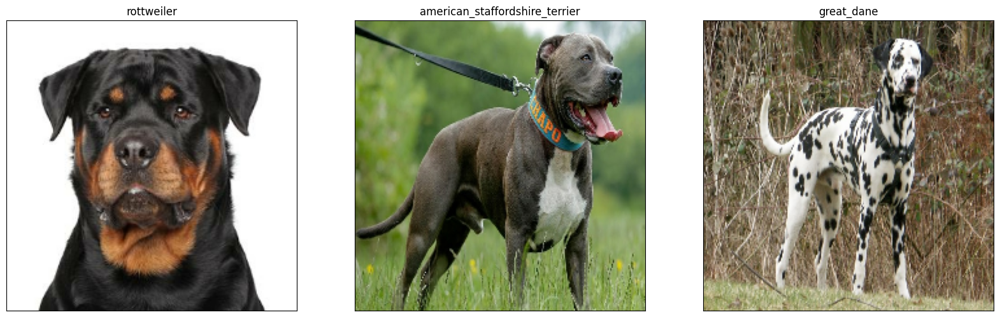

In [42]:
# let's check custom image prediction
plt.figure(figsize=(20, 20))
for i, image in enumerate(custom_images):
  plt.subplot(1, 3, i+1)
  plt.xticks([])
  plt.yticks([])
  plt.title(custom_pred_labels[i])
  plt.imshow(image)